<a href="https://colab.research.google.com/github/JunyiJ/DeepGenerativeModels/blob/master/DenoisingDiffusionProbablisticModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **0. Load Preliminary Functions**

# a. Import Libraries and Functions

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets
from torchvision import models
from torchvision import transforms
from torch.autograd import Variable

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from mpl_toolkits.mplot3d import Axes3D
from tqdm.notebook import tqdm
import numpy as np
import pickle
import itertools
import math


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# b. MNIST Data Loader

In [3]:
tensor_transform = transforms.Compose([
    transforms.ToTensor()
])

batch_size = 256
train_dataset = datasets.MNIST(root = "./data",
									train = True,
									download = True,
									transform = tensor_transform)
test_dataset = datasets.MNIST(root = "./data",
									train = False,
									download = True,
									transform = tensor_transform)

train_loader = torch.utils.data.DataLoader(dataset = train_dataset,
							   batch_size = batch_size,
								 shuffle = True)
test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
							   batch_size = batch_size,
								 shuffle = False)


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:11<00:00, 901kB/s] 


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:01<00:00, 1.27MB/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 5.41MB/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



# **1. DDPM**


# a. Building Blocks

In [4]:
class ResidualConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.same_channels = in_channels==out_channels
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
          x1 = self.conv1(x)
          x2 = self.conv2(x1)
          if self.same_channels:
              out = x + x2
          else:
              out = x1 + x2
          return out / 1.414


class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()
        layers = [ResidualConvBlock(in_channels, out_channels), nn.MaxPool2d(2)]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x


class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)


class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat = 256, n_classes=10):
        super(ContextUnet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes

        self.init_conv = ResidualConvBlock(in_channels, n_feat)

        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

        self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())

        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_classes, 2*n_feat)
        self.contextembed2 = EmbedFC(n_classes, 1*n_feat)

        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, 7, 7),
            nn.GroupNorm(8, 2 * n_feat),
            nn.ReLU(),
        )

        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),
        )

    def forward(self, x, c, t, context_mask):
        x = self.init_conv(x)
        down1 = self.down1(x)
        down2 = self.down2(down1)
        hiddenvec = self.to_vec(down2)

        c = nn.functional.one_hot(c, num_classes=self.n_classes).type(torch.float)

        context_mask = context_mask[:, None]
        context_mask = context_mask.repeat(1,self.n_classes)
        context_mask = (-1*(1-context_mask)) # need to flip 0 <-> 1
        c = c * context_mask

        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1+ temb1, down2)
        up3 = self.up2(cemb2*up2+ temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out

# b. DDPM Schedules

In [5]:
def ddpm_schedules(beta1, beta2, T):
    assert beta1 < beta2 < 1.0, "beta1 and beta2 must be in (0, 1)"
    beta_t = (beta2 - beta1) * torch.arange(0, T, dtype=torch.float32) / T + beta1
    sqrt_beta_t = torch.sqrt(beta_t)
    alpha_t = 1 - beta_t
    alphabar_t = torch.cumprod(alpha_t, dim=0)
    oneover_sqrta = 1 / torch.sqrt(alpha_t)

    sqrtab = torch.sqrt(alphabar_t)
    sqrtmab = torch.sqrt(1 - alphabar_t)
    mab_over_sqrtmab  = (1 - alpha_t) / sqrtmab

    return {
        "alpha_t": alpha_t,  # \alpha_t
        "oneover_sqrta": oneover_sqrta,  # 1/\sqrt{\alpha_t}
        "sqrt_beta_t": sqrt_beta_t,  # \sqrt{\beta_t}
        "alphabar_t": alphabar_t,  # \bar{\alpha_t}
        "sqrtab": sqrtab,  # \sqrt{\bar{\alpha_t}}
        "sqrtmab": sqrtmab,  # \sqrt{1-\bar{\alpha_t}}
        "mab_over_sqrtmab": mab_over_sqrtmab,  # (1-\alpha_t)/\sqrt{1-\bar{\alpha_t}}
    }

# c. DDPM Main Module



In [17]:
class DDPM(nn.Module):
    def __init__(self, nn_model, betas, n_T, device, drop_prob=0.1):
        super(DDPM, self).__init__()
        self.nn_model = nn_model.to(device)

        for k, v in ddpm_schedules(betas[0], betas[1], n_T).items():
            self.register_buffer(k, v)

        self.n_T = n_T
        self.device = device
        self.drop_prob = drop_prob
        self.loss_mse = nn.MSELoss()

    def forward(self, x, c):
        t = torch.randint(1, self.n_T, (x.shape[0],)).to(self.device).long()
        noise = torch.randn_like(x)
        context_mask = (torch.rand(x.shape[0], device=self.device) > self.drop_prob).float()

        x_t = self.sqrtab[t].view(-1, 1,1,1) * x + self.sqrtmab[t].view(-1,1,1,1) * noise
        predicted_noise = self.nn_model(x_t, c, t.float(), context_mask)
        loss = self.loss_mse(noise, predicted_noise)
        return loss

    def sample(self, n_sample, size, device, guide_w=0.0):
        x_i = torch.randn(n_sample, *size).to(device)
        c_i = torch.arange(0, 10).to(device)
        c_i = c_i.repeat(n_sample // c_i.shape[0])

        context_mask = torch.ones_like(c_i).float().to(device)

        for i in range(self.n_T-1, -1, -1):
            print(f'Sampling timestep {i}', end='\r')
            pred_noise = self.nn_model(x_i, c_i, torch.tensor([i]).float().to(device), context_mask)
            x_i = self.oneover_sqrta[i].view(-1, 1,1,1) * (x_i - self.mab_over_sqrtmab[i].view(-1, 1,1,1) * pred_noise)
            if i > 0:
              z = torch.randn_like(x_i)
              x_i = x_i + z * self.sqrt_beta_t[i].view(-1, 1,1,1)
        return x_i

    def ddit_sample(self, n_sample, size, device, steps, guide_w=0.0):
        x_i = torch.randn(n_sample, *size).to(device)
        c_i = torch.arange(0, 10).to(device)
        c_i = c_i.repeat(n_sample // c_i.shape[0])

        context_mask = torch.ones_like(c_i).float().to(device)

        time_steps = torch.linspace(0, self.n_T-1, steps, device=device).long().flip(0)
        for i in range(len(time_steps)-1):
          t = time_steps[i]
          t_next = time_steps[i+1]
          pred_noise = self.nn_model(x_i, c_i, torch.tensor([t]).float().to(device), context_mask)
          x_i = self.sqrtab[t_next] * ((x_i - self.sqrtmab[t] * pred_noise) / self.sqrtab[t]) + self.sqrtmab[t_next] * pred_noise
        return x_i

# c. Training Function

In [19]:
def train_main_loop(ddpm, optim, dataloader, lr,
                    ws_test, n_epoch, batch_size, use_ddim=False, steps=50):
    for ep in range(n_epoch):
        print(f'epoch {ep}')
        ddpm.train()

        # linear lrate decay
        optim.param_groups[0]['lr'] = lr*(1-ep/n_epoch)

        pbar = tqdm(dataloader)
        loss_ema = None
        # train
        for x, c in pbar:
            optim.zero_grad()
            x = x.to(device)
            c = c.to(device)
            loss = ddpm(x, c)
            loss.backward()
            if loss_ema is None:
                loss_ema = loss.item()
            else:
                loss_ema = 0.95 * loss_ema + 0.05 * loss.item()
            pbar.set_description(f"loss: {loss_ema:.4f}")
            optim.step()

        # eval
        ddpm.eval()
        with torch.no_grad():
            n_sample = 20
            for w_i, w in enumerate(ws_test):
                x_gen = ddpm.sample(n_sample, (1, 28, 28), device, guide_w=w) if not use_ddim else ddpm.ddit_sample(n_sample, (1, 28, 28), device, steps=steps)

            fig, ax = plt.subplots(5, 4, figsize=(6, 6))
            for i, j in itertools.product(range(5), range(4)):
                ax[i,j].get_xaxis().set_visible(False)
                ax[i,j].get_yaxis().set_visible(False)

            for k in range(n_sample):
                i = k//4
                j = k%4
                ax[i,j].cla()
                ax[i,j].imshow(x_gen[k,:].data.cpu().numpy().reshape(28, 28), cmap='Greys')
            plt.show()

        if ep == n_epoch - 1:
          plt.savefig('final_generated_samples.png', bbox_inches='tight')


# e. Training


epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

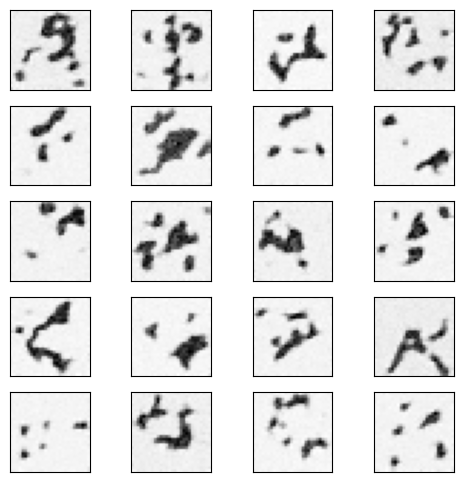

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

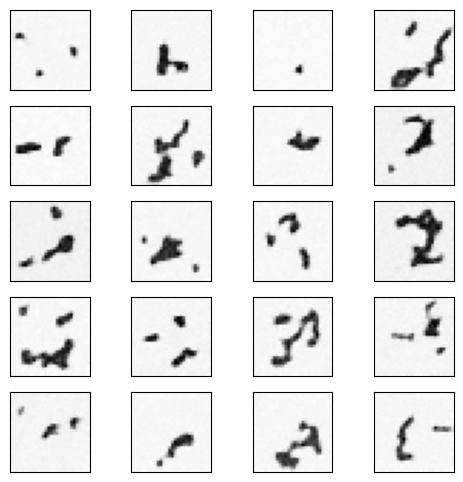

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

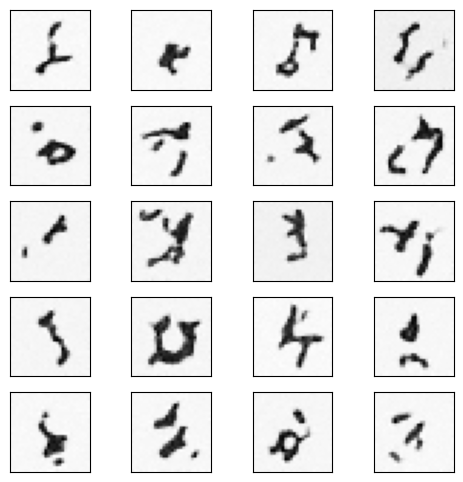

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

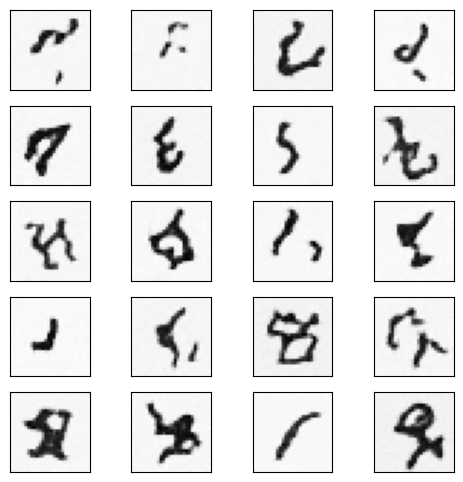

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

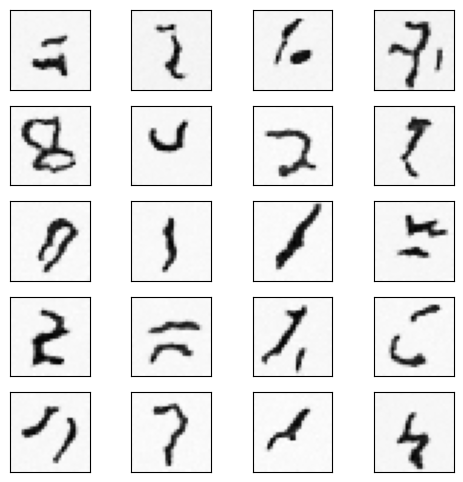

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

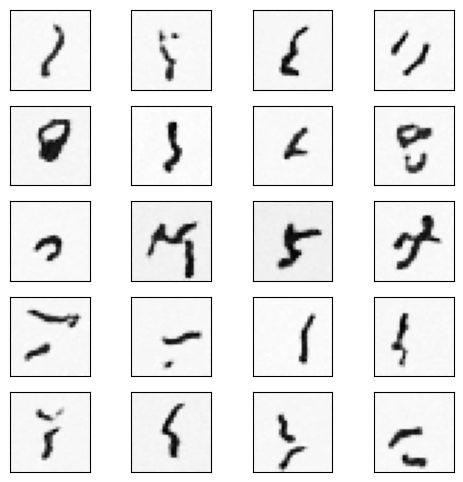

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

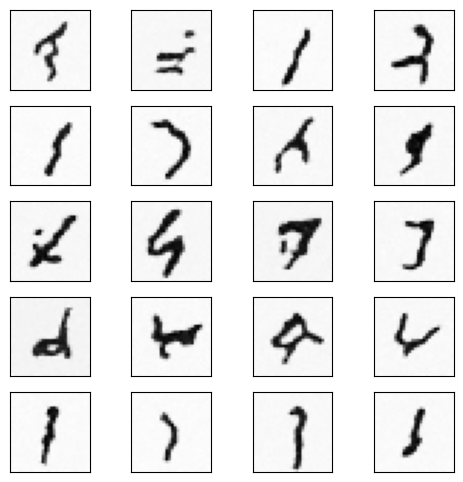

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

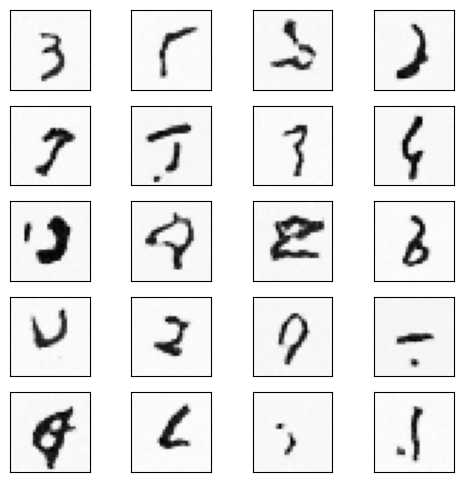

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

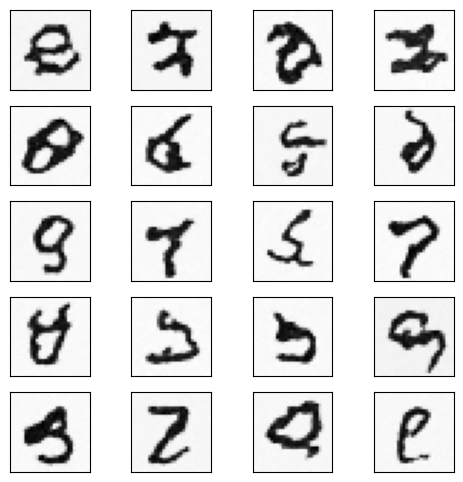

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

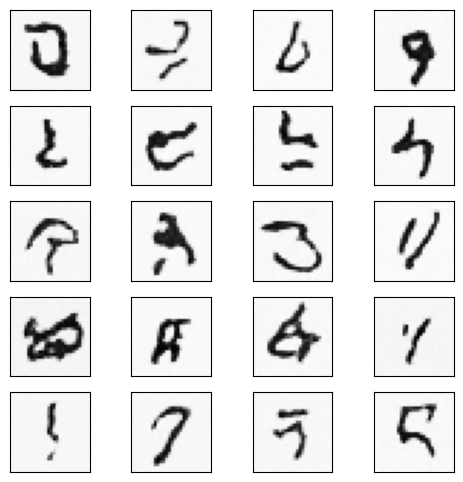

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

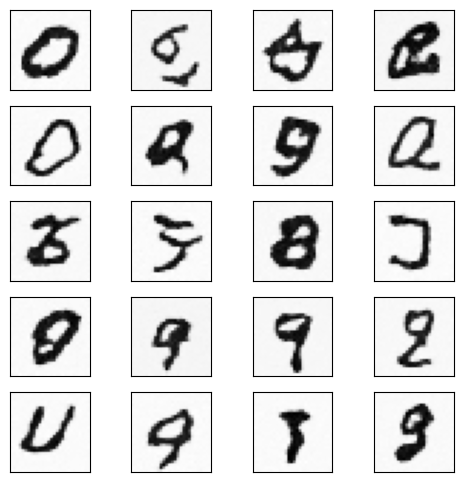

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

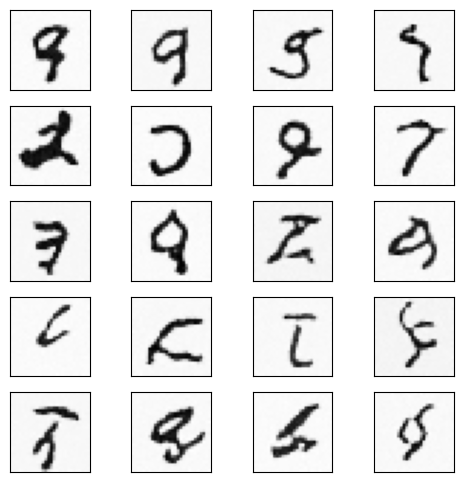

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

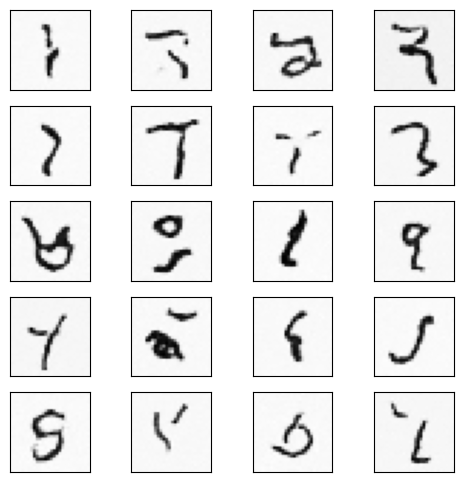

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

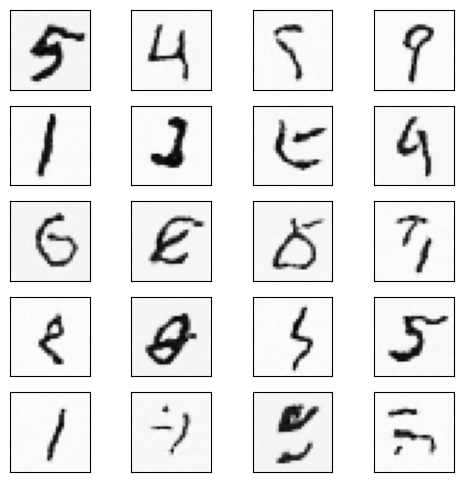

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

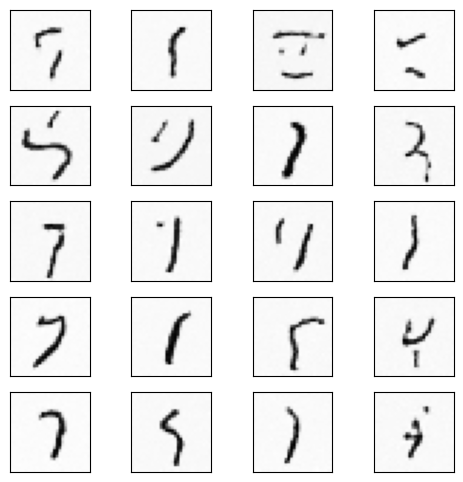

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

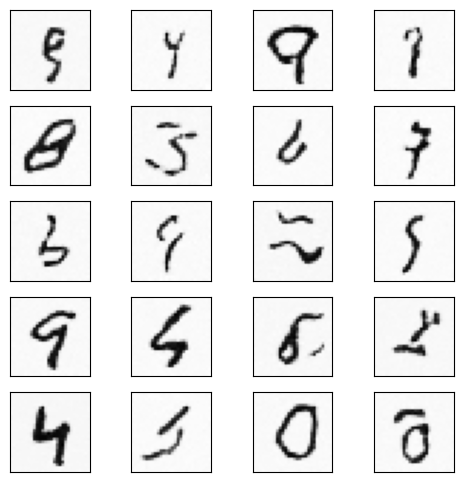

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

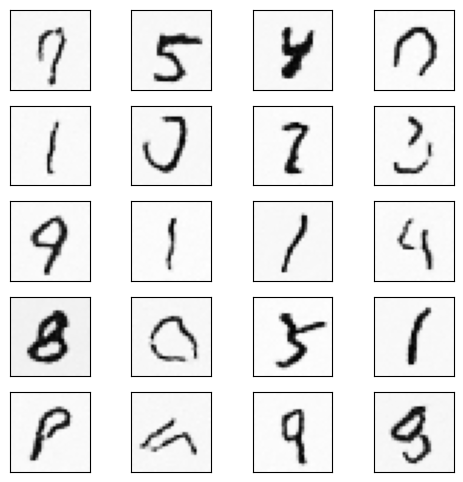

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

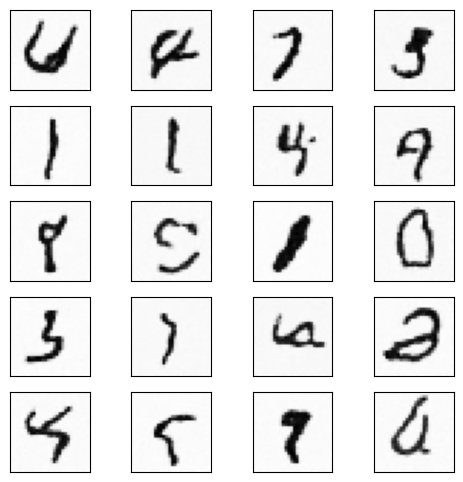

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

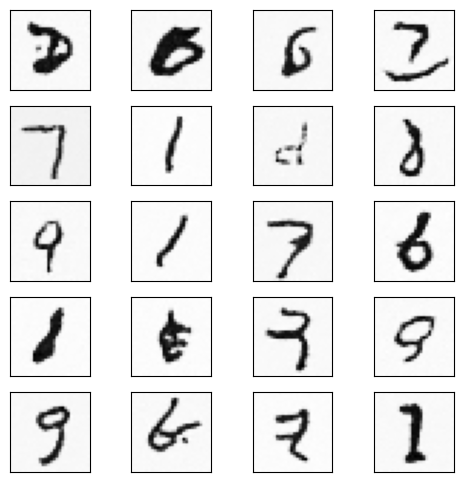

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

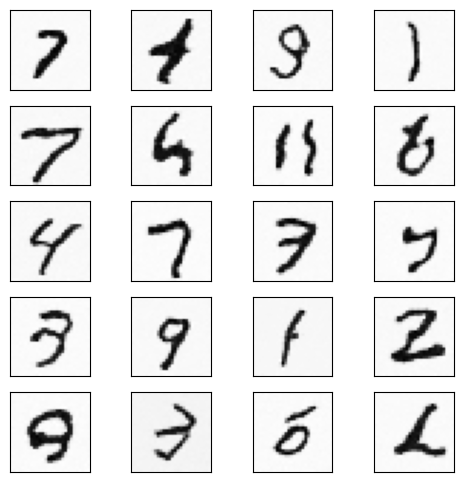

<Figure size 640x480 with 0 Axes>

In [7]:
# hardcoding these here
n_epoch = 20
n_T = 400
n_feat = 128
lr = 1e-4
ws_test = [0.0, 0.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size)


# **2. Train with 2000 Timesteps**

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

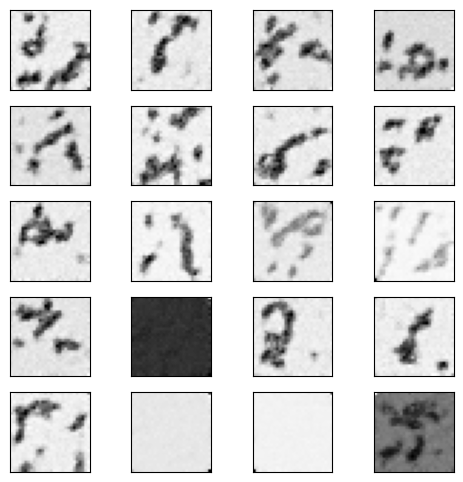

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

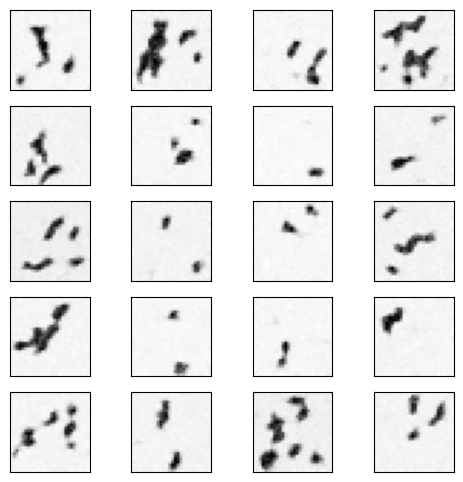

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

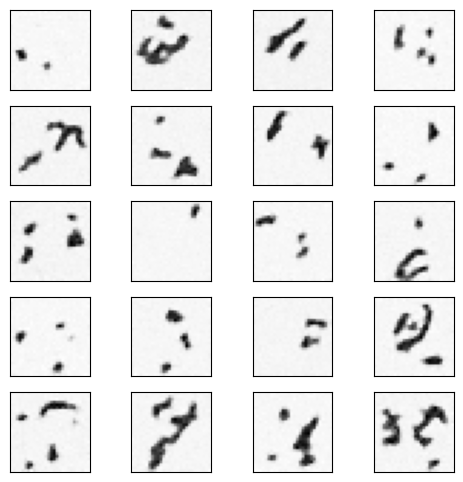

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

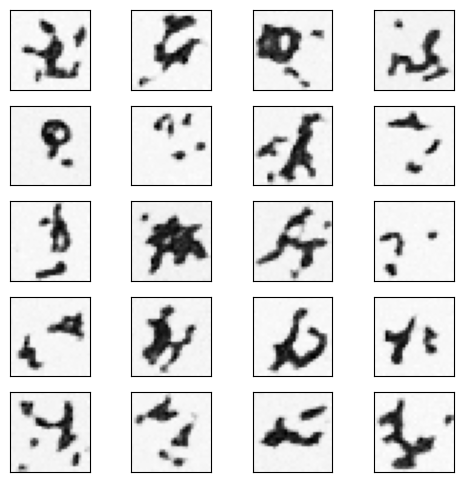

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

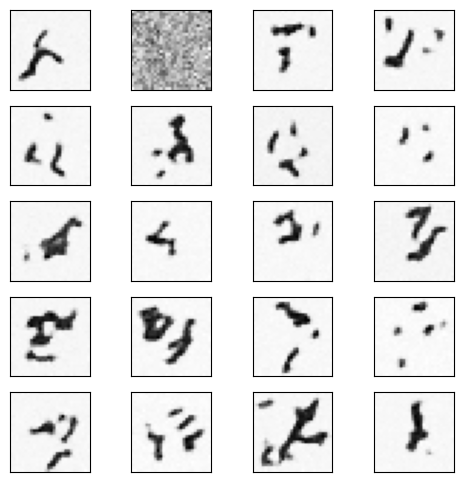

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

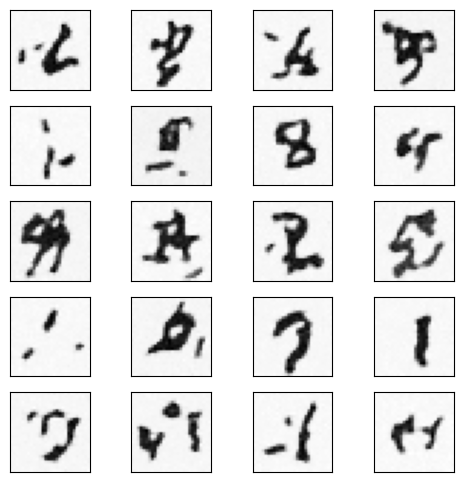

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

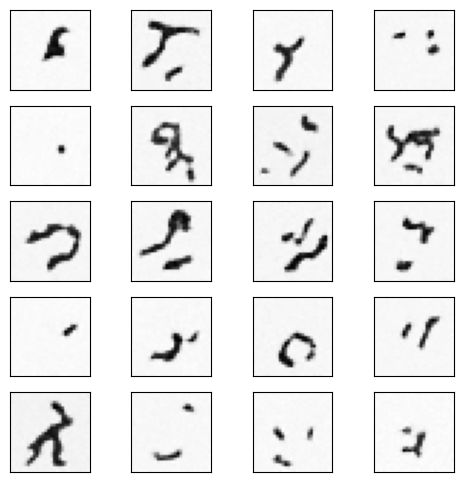

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

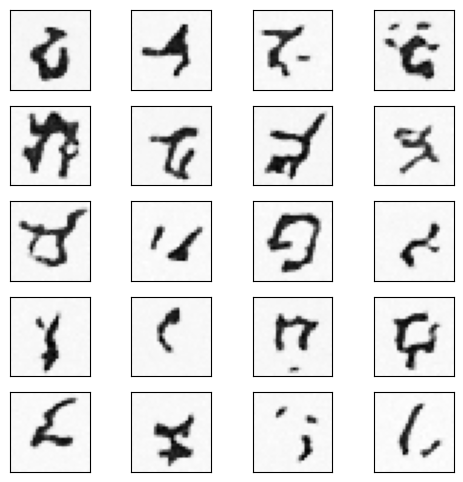

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

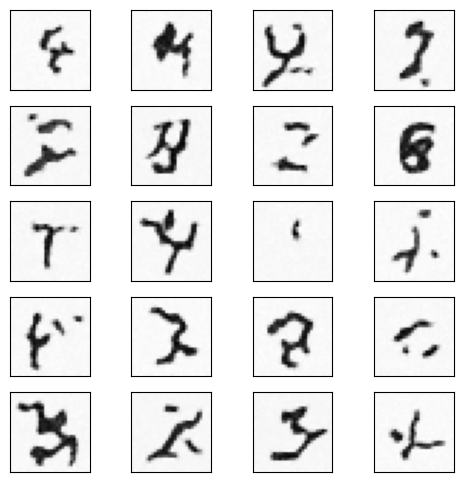

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

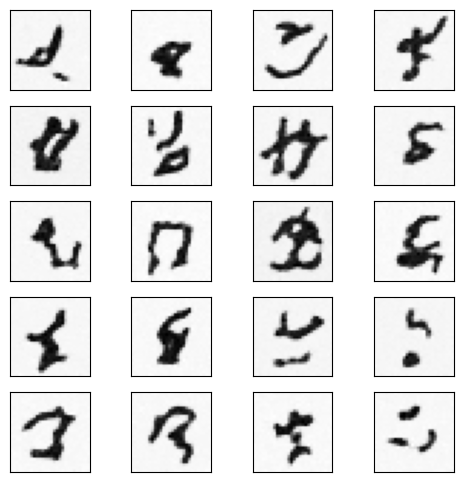

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

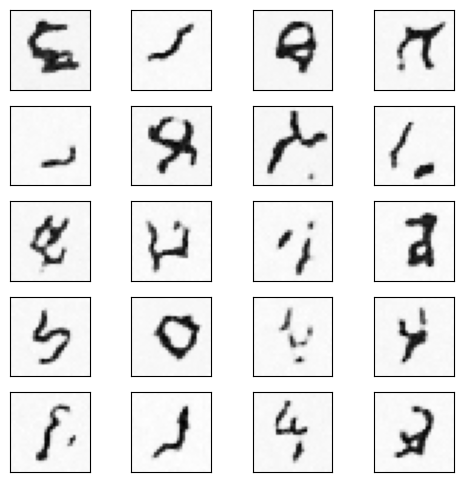

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

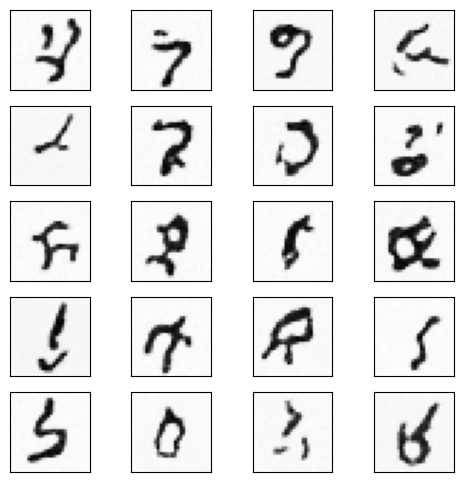

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

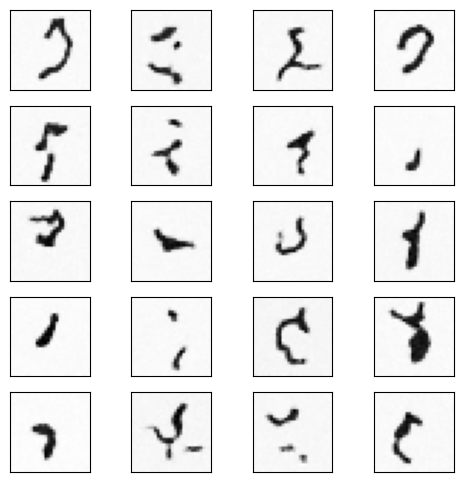

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

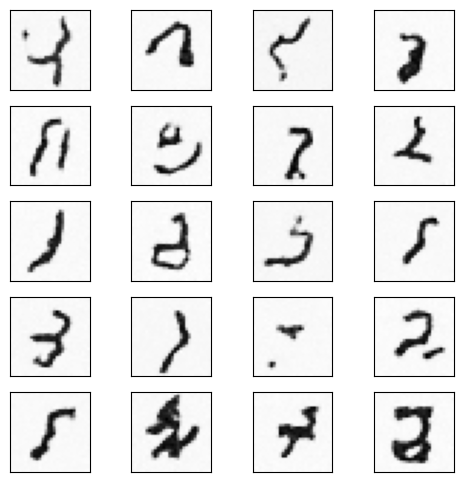

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

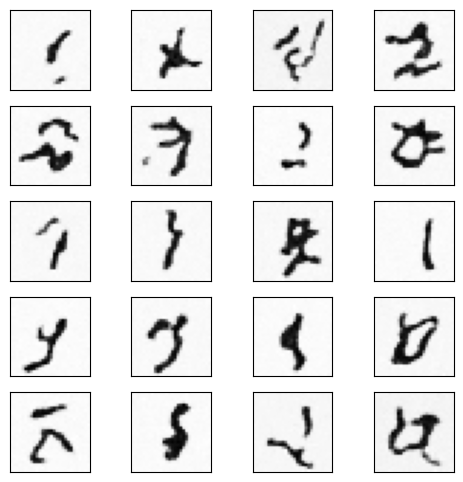

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

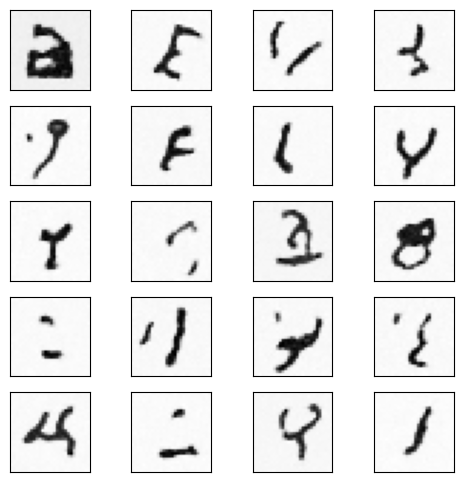

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

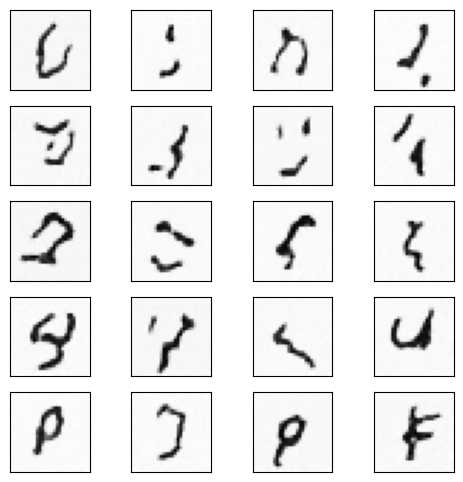

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

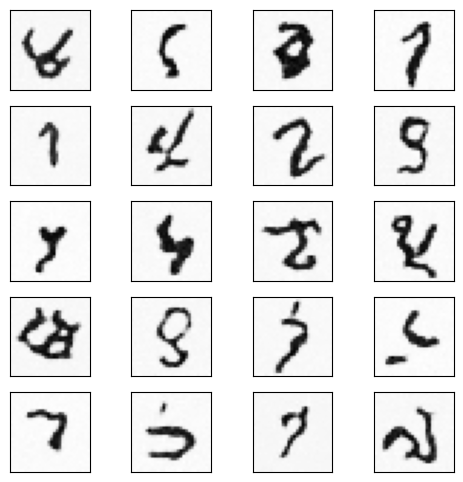

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

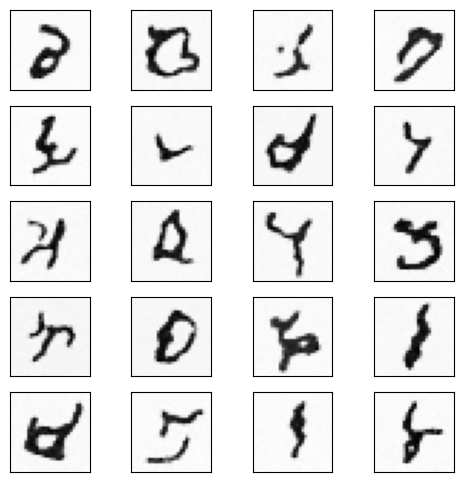

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

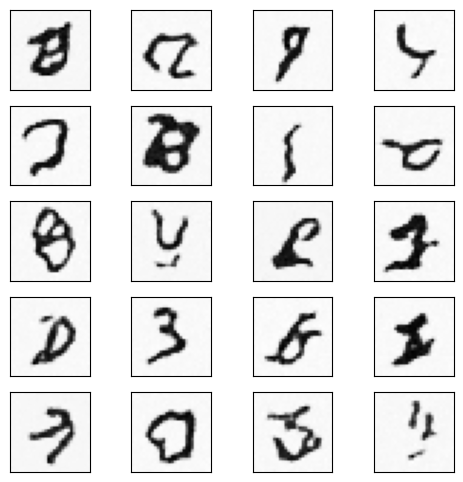

<Figure size 640x480 with 0 Axes>

In [8]:
n_epoch = 20
n_T = 2000
n_feat = 128
lr = 1e-4
ws_test = [0.0, 0.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size)


# **3. Fewer Sampling Steps(DDIM - 50 steps)**

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

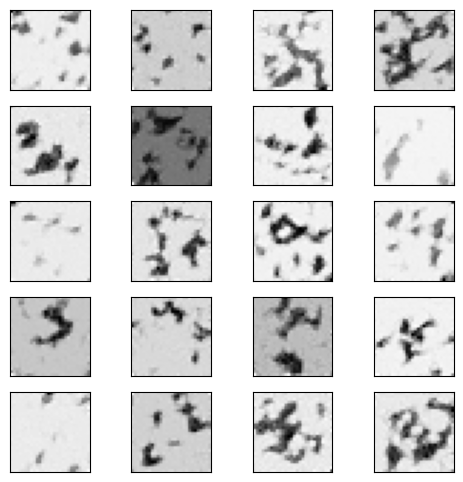

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

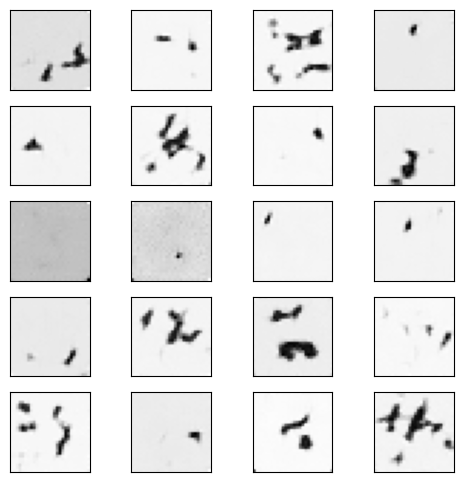

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

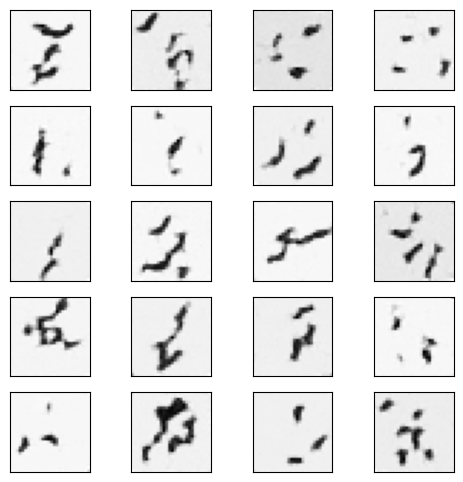

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

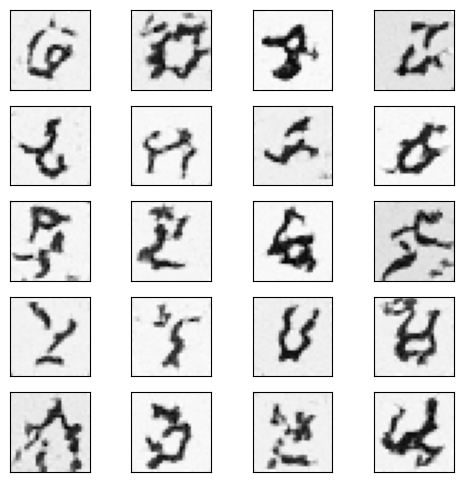

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

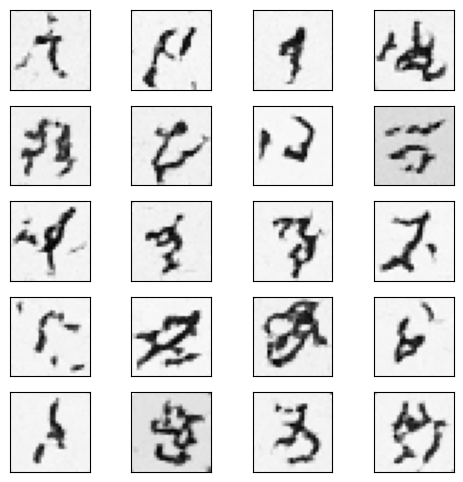

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

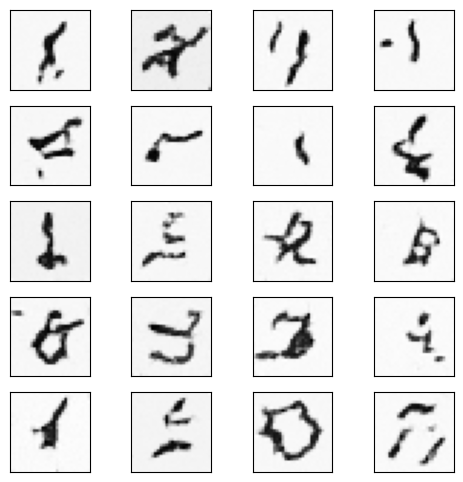

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

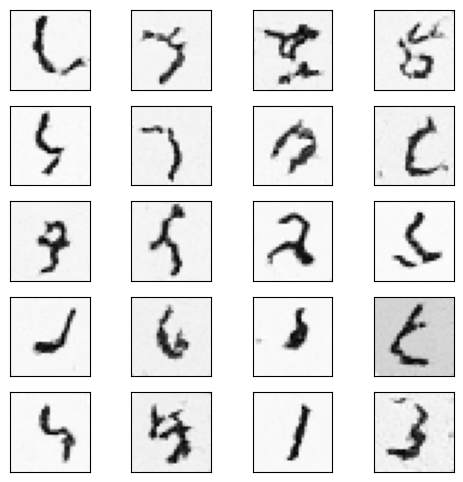

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

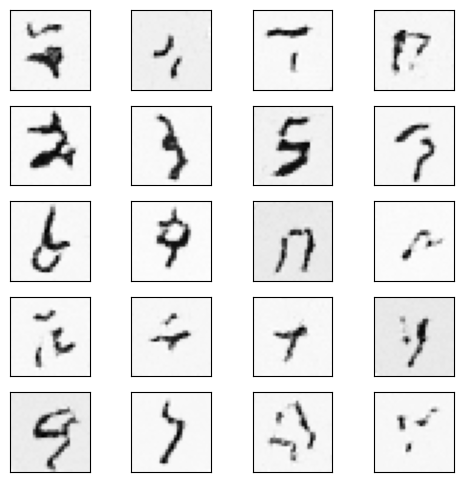

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

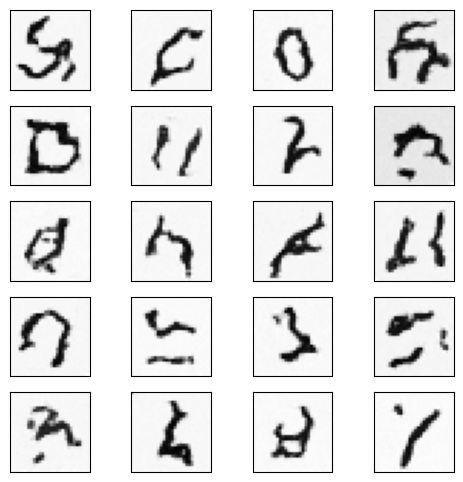

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

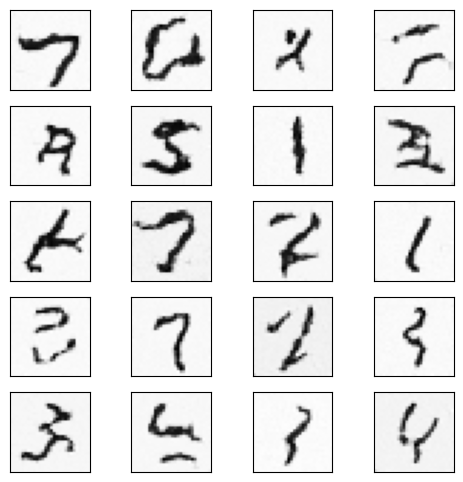

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

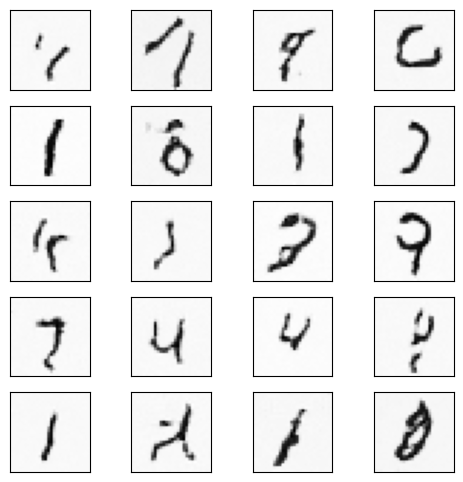

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

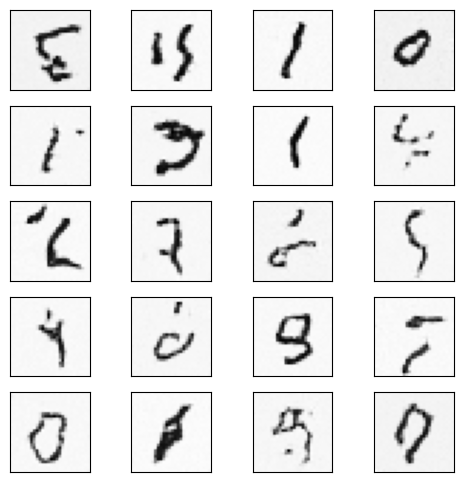

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

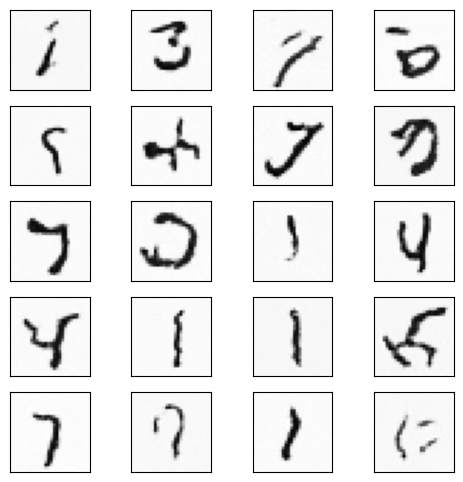

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

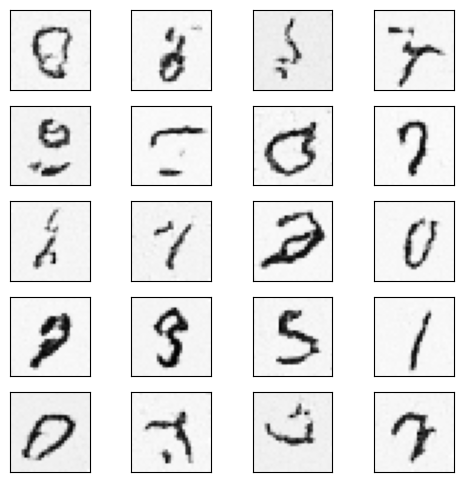

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

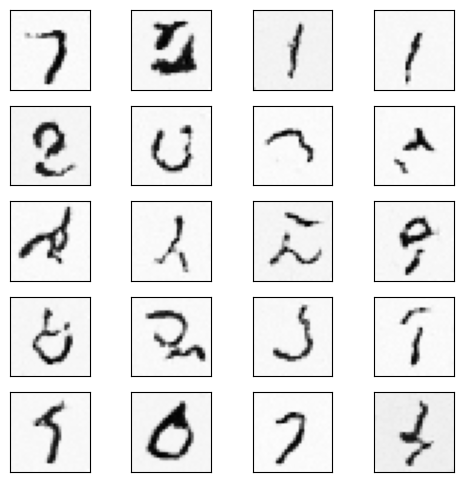

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

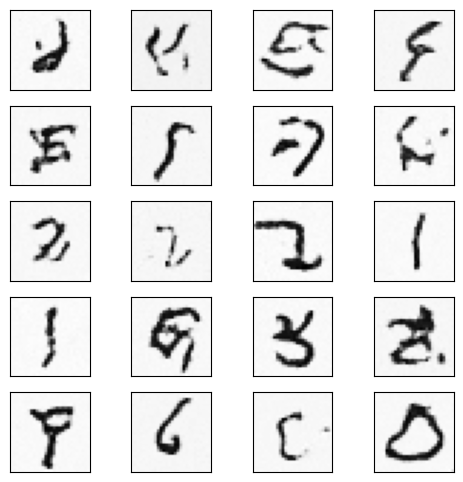

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

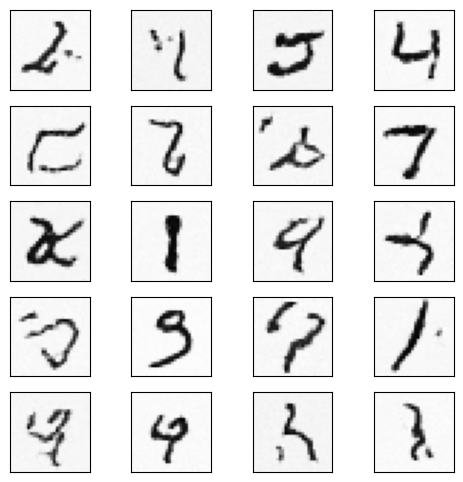

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

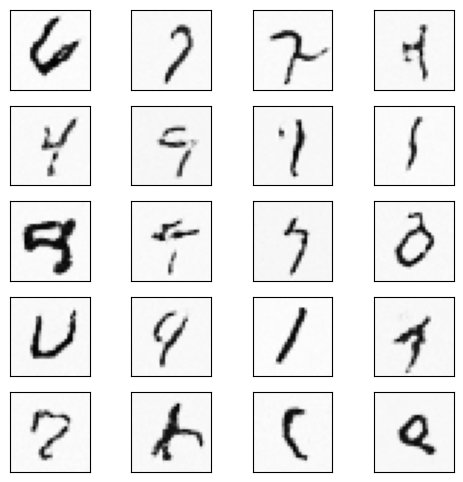

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

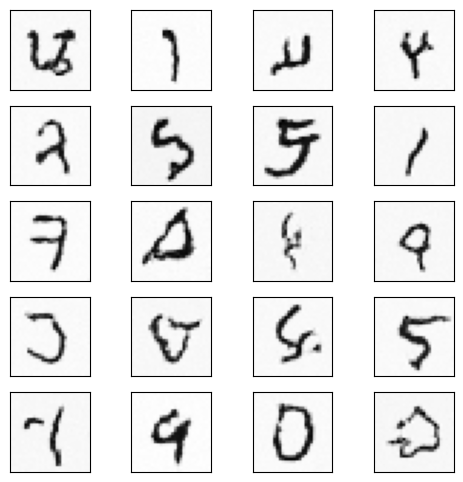

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

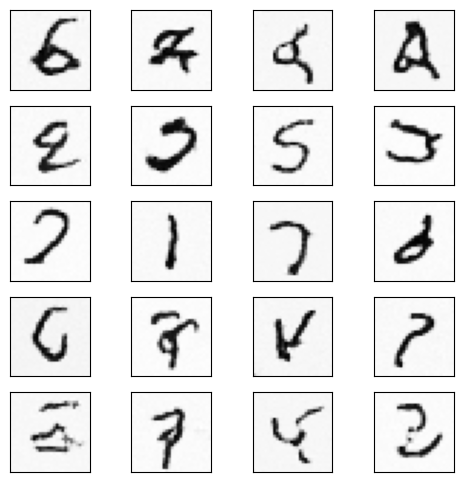

<Figure size 640x480 with 0 Axes>

In [18]:
n_epoch = 20
n_T = 400
n_feat = 128
lr = 1e-4
ws_test = [0.0, 0.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size, use_ddim=True)

# **4. Fewer Sampling Steps(DDIM - 100 steps)**

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

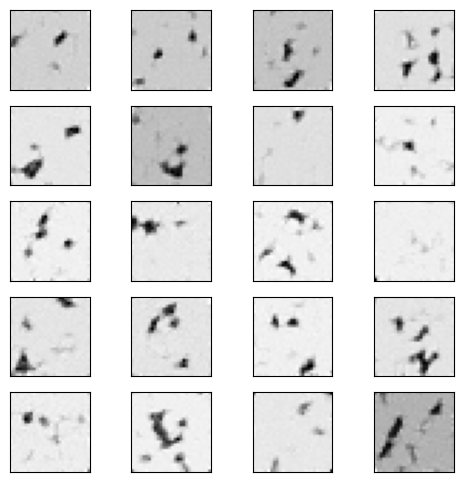

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

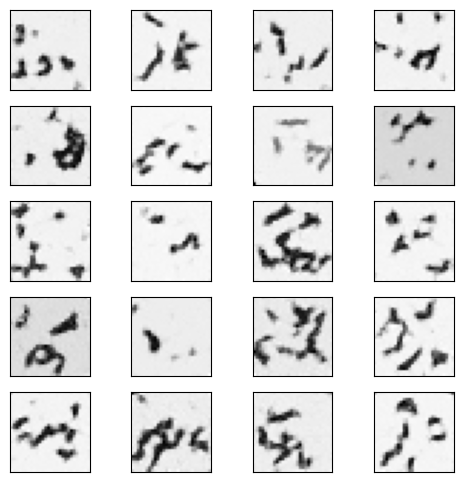

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

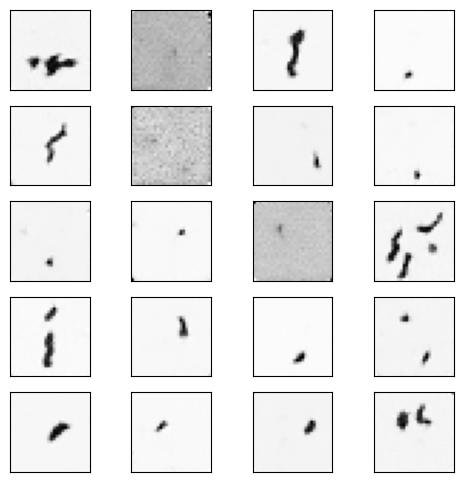

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

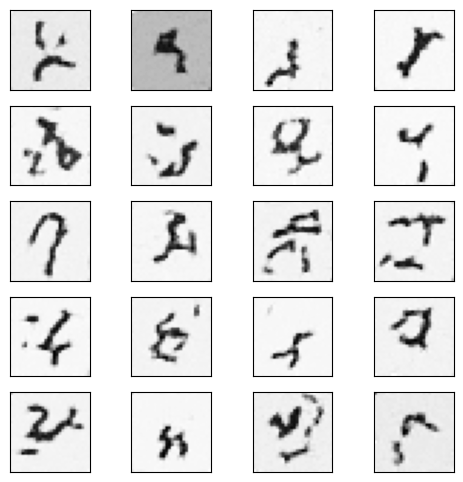

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

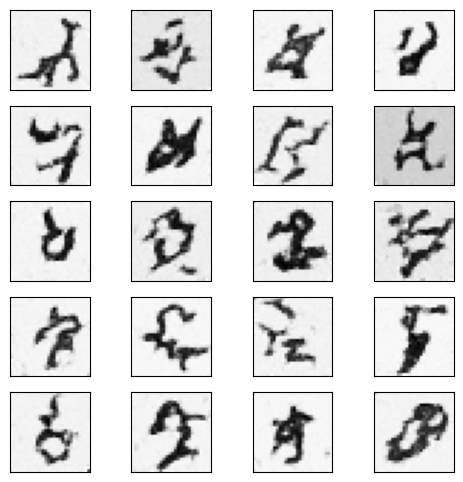

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

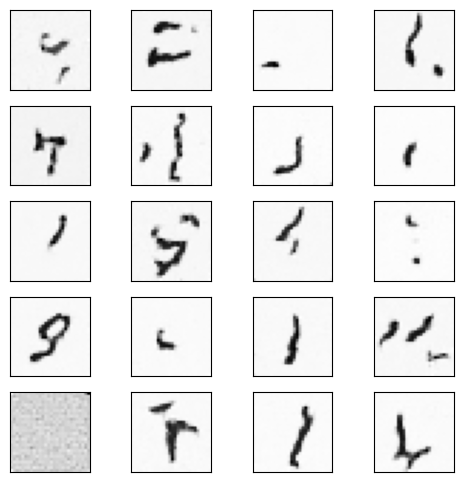

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

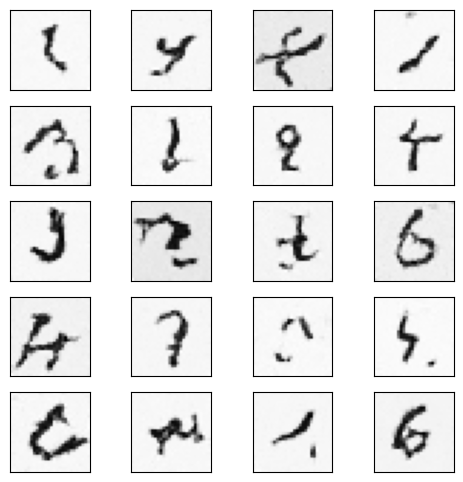

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

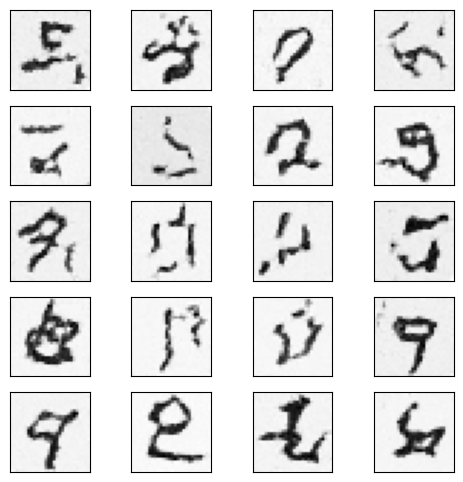

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

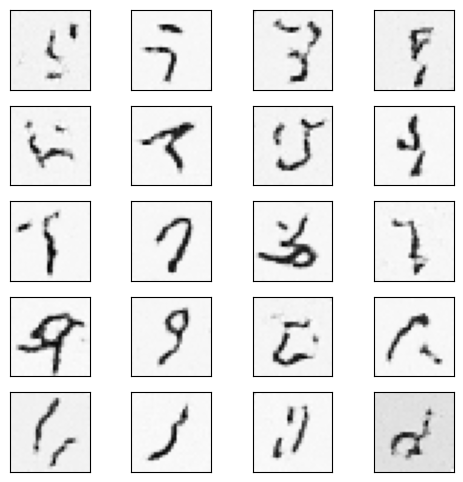

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

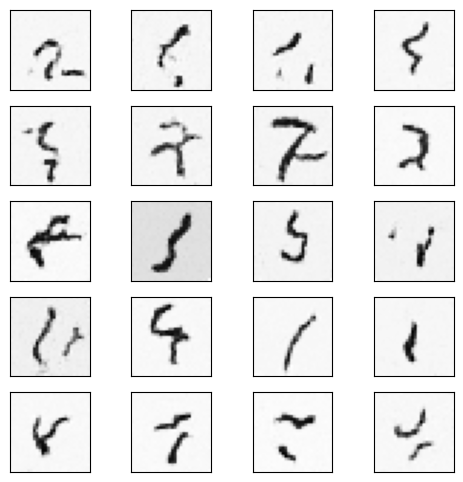

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

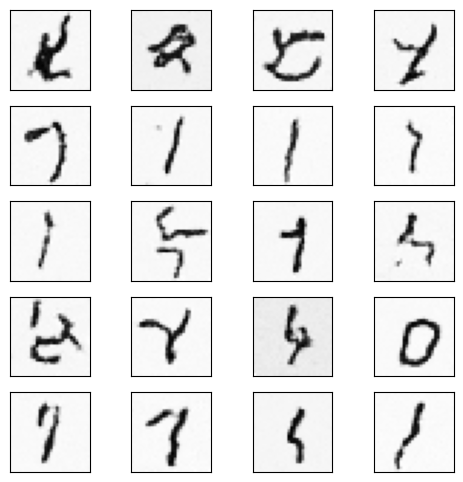

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

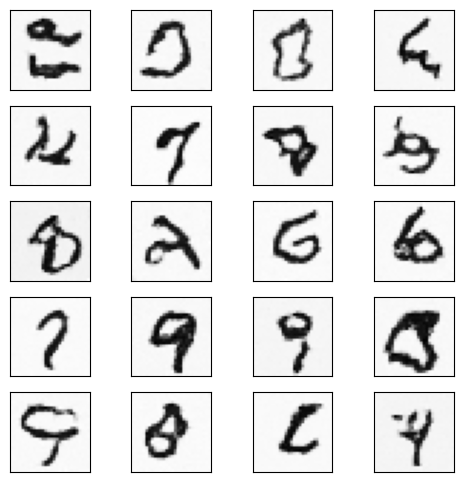

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

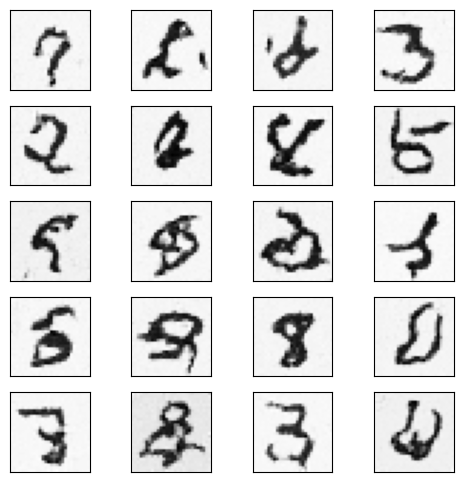

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

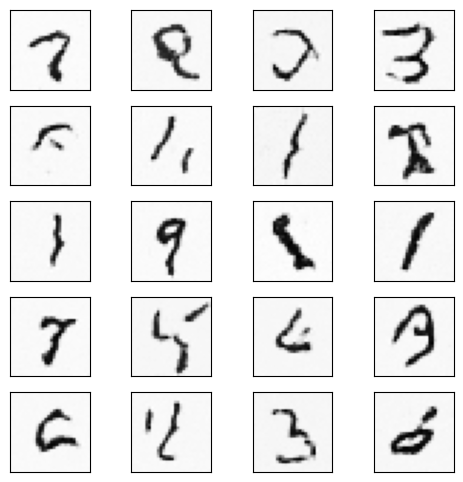

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

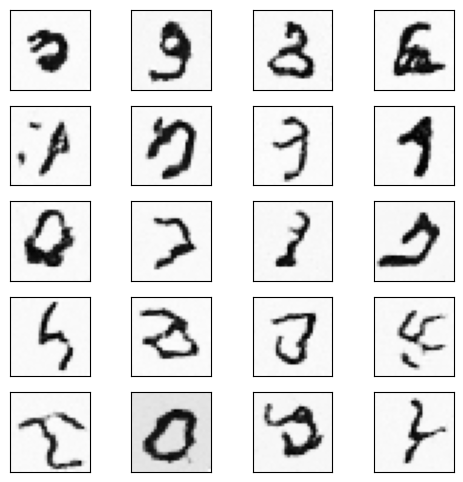

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

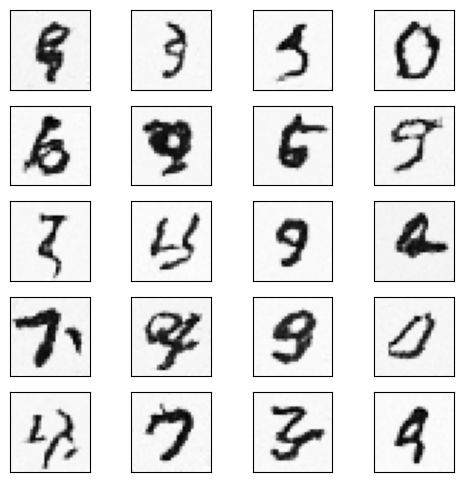

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

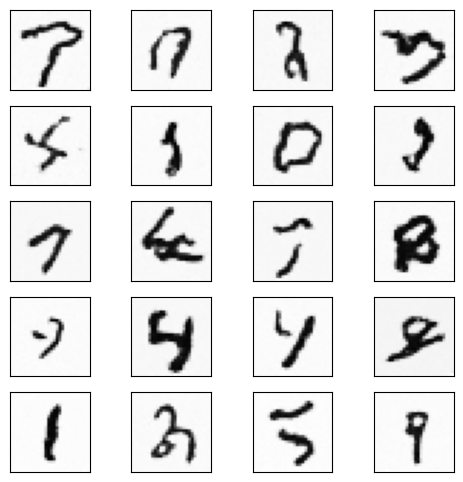

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

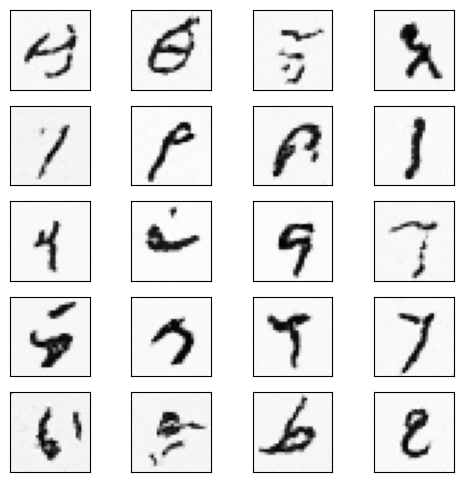

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

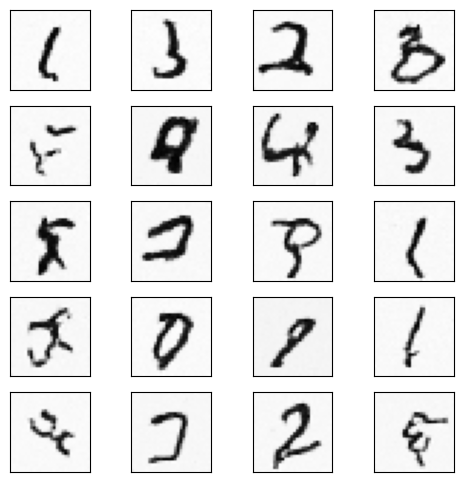

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

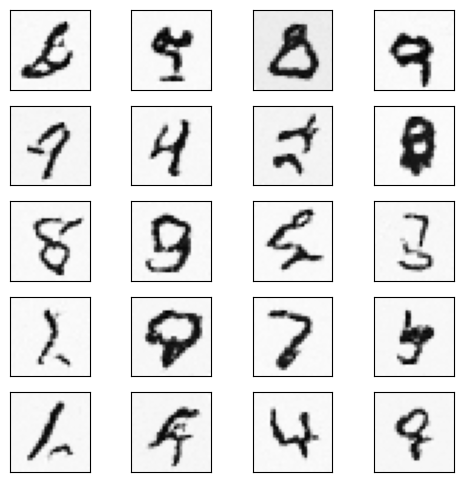

<Figure size 640x480 with 0 Axes>

In [20]:
n_epoch = 20
n_T = 400
n_feat = 128
lr = 1e-4
ws_test = [0.0, 0.5, 2.0]

ddpm = DDPM(nn_model=ContextUnet(in_channels=1, n_feat=n_feat, n_classes=10), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1)
ddpm.to(device)

tf = transforms.Compose([transforms.ToTensor()]) # mnist is already normalised 0 to 1

optim = torch.optim.Adam(ddpm.parameters(), lr=lr)
train_main_loop(ddpm, optim, train_loader, lr, ws_test, n_epoch, batch_size, use_ddim=True, steps=100)